In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import Pool, CatBoostClassifier, CatBoostRegressor
import numpy as np

import plotly.graph_objects  as go

from sklearn.metrics import mean_absolute_error as _mae, mean_absolute_percentage_error as _mape

import os
import re 
from tqdm import tqdm 

from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeRegressor
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor

In [2]:
df = pd.read_csv('../catboost classifier/dataset_final.csv')

c:\Users\maksk\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (48) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df = df[
    (df['salary_from_rate_and_gross'] > 13_500) 
        &
    (df['salary_from_rate_and_gross'] < 230_000) 
]

In [4]:
stop_words = stopwords.words('russian')
vectorizer = TfidfVectorizer(max_features=300, stop_words=stop_words, min_df=100)
tfidf_array = np.array(vectorizer.fit_transform(df['description_clear_lemm']).todense(), dtype=np.float32)
tfidf_array = np.delete(tfidf_array, [0, 1, 2, 3, 5, 7, 8, 9], 1)
columns = np.delete(vectorizer.get_feature_names_out(), [0, 1, 2, 3, 5, 7, 8, 9])

In [5]:
tfidf_features = []
for i in range(len(columns)):
    df.loc[:, 'description_tfidf_' + columns[i]] = tfidf_array[:, i]
    tfidf_features.append('description_tfidf_' + columns[i])

In [6]:
features = {
    'features': [
        'billing_type',
        'schedule',
        'name',
        'area',
        'allow_messages',
        'experience',
        'accept_handicapped',
        'accept_kids',
        'employer',
        'accept_temporary',
        '15',
        'lat',
        'lng',
        'department_name',
        'has_department',
        # 'description_clear',
        'description_len',
        'uniq_skills_cnt',
        'uniq_popular_skills_cnt',
        'professional_roles_id',
        'dollar_rate',
        'is_engl',
        'is_ger',
        'is_chi',
        'cnt_lang',
        'salary_from_rate_and_gross_log',
    ],
    'cat_features': [
        'billing_type',
        'schedule',
        'area',
        'experience',
        'employer',
        '15',
        'department_name',
        'professional_roles_id'
    ],
    'text_features': [
        'name',
        # 'description_clear'
    ]
}
features['features'] += ['mean_similar', 'min_similar', 'max_similar', 'feature_290', 'feature_370'] 
features['features'] += tfidf_features

In [35]:
df[['uniq_skills_cnt', 'uniq_popular_skills_cnt']] = df[['uniq_skills_cnt', 'uniq_popular_skills_cnt']].fillna(0)

# CatBoost

In [36]:
def pool(data, label, cat_features, text_features):
    return Pool(
        data=data,
        label=label,
        cat_features=cat_features,
        text_features=text_features,
    )

def train(df:pd.DataFrame, features:dict, device='GPU'):
    cat_features = features['cat_features']
    text_features = features['text_features']
    features = features['features']
    X_train, X_valid, y_train, y_valid = train_test_split(
        df[features].drop(['salary_from_rate_and_gross_log'], axis=1),
        df['salary_from_rate_and_gross_log'], 
        test_size=0.3,
        random_state=0,
    )
    X_valid, X_test, y_valid, y_test = train_test_split(X_valid, y_valid, test_size=0.5, random_state=0)

    pools = {}
    print(X_train.shape)
    pools['train'] = pool(X_train, y_train, cat_features, text_features)
    pools['valid'] = pool(X_valid, y_valid, cat_features, text_features)
    pools['test'] = pool(X_test, y_test, cat_features, text_features)
    model = CatBoostRegressor(iterations = 1_500, loss_function = 'MAE')
    model.fit(
        pools['train'],
        eval_set=[pools['valid'], pools['test']],
        use_best_model=True,
        plot=False,
        verbose=50,
        early_stopping_rounds=50,
    )
    datasets = {
        'train': [X_train, y_train],
        'valid': [X_valid, y_valid],
        'test': [X_test, y_test]
    }
    y_pred = model.predict(pools['test'])

    plot(np.exp(y_test), np.exp(y_pred))
    scatter_plot(np.exp(y_test), np.exp(y_pred))
    return model, pools, datasets


def plot(salary_real, salary_hat):
    fig = go.Figure()
    fig.add_trace(go.Histogram(
        x=salary_real, histnorm='percent',
        xbins=dict( # bins used for histogram
            start=10_000,
            end=260_000,
            size=5_000,
        ),
    name = 'real'))
    fig.add_trace(go.Histogram(
        x=np.round(salary_hat, 0), histnorm='percent', xbins=dict( # bins used for histogram
            start=10_000,
            end=260_000,
            size=5_000,
        ), name='heuristics'))

    # Overlay both histograms
    mae = _mae(salary_real, salary_hat)
    mape = _mape(salary_real, salary_hat)
    fig.update_layout(
        barmode='overlay',
        title_text=f'MAE = {mae}\tMAPE = {mape:.0%} on Test', # title of plot
        xaxis_title_text='salary', # xaxis label
        yaxis_title_text='percent', # yaxis label
    )
    # Reduce opacity to see both histograms
    fig.update_traces(opacity=0.75)
    fig.show(renderer='notebook')

def scatter_plot(salary_real, salary_hat):
    plt.scatter(salary_real, salary_hat, alpha=0.01)
    plt.plot(salary_real, salary_real, color='red', label='Real line')
    plt.xlabel('real salary')
    plt.ylabel('predict salary')
    plt.title('Зависимость реальной и предсказанной зарплаты')
    plt.legend()
    plt.grid(True)
    plt.show()


(109936, 321)
0:	learn: 0.4058099	test: 0.4061948	test1: 0.4088391	best: 0.4088391 (0)	total: 287ms	remaining: 7m 10s
50:	learn: 0.2384645	test: 0.2381936	test1: 0.2399016	best: 0.2399016 (50)	total: 12.8s	remaining: 6m 3s
100:	learn: 0.2011197	test: 0.1997576	test1: 0.2007779	best: 0.2007779 (100)	total: 24.9s	remaining: 5m 45s
150:	learn: 0.1918133	test: 0.1903310	test1: 0.1908826	best: 0.1908826 (150)	total: 36.8s	remaining: 5m 28s
200:	learn: 0.1875406	test: 0.1863289	test1: 0.1867557	best: 0.1867557 (200)	total: 48.8s	remaining: 5m 15s
250:	learn: 0.1843283	test: 0.1832968	test1: 0.1835460	best: 0.1835460 (250)	total: 1m	remaining: 5m 1s
300:	learn: 0.1823185	test: 0.1814505	test1: 0.1816371	best: 0.1816371 (300)	total: 1m 12s	remaining: 4m 47s
350:	learn: 0.1807363	test: 0.1800710	test1: 0.1802426	best: 0.1802426 (350)	total: 1m 22s	remaining: 4m 31s
400:	learn: 0.1792447	test: 0.1787504	test1: 0.1788986	best: 0.1788986 (400)	total: 1m 34s	remaining: 4m 17s
450:	learn: 0.1776277	

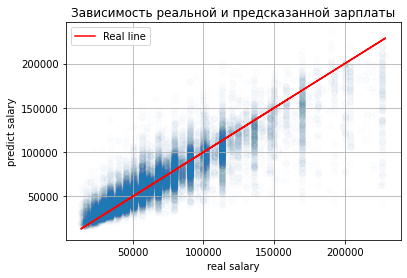

In [37]:
model, pools, datasets = train(df, features=features)

In [10]:
import shap
explainer = shap.TreeExplainer(_[0])
shap_values = explainer.shap_values(_[1]['test'])

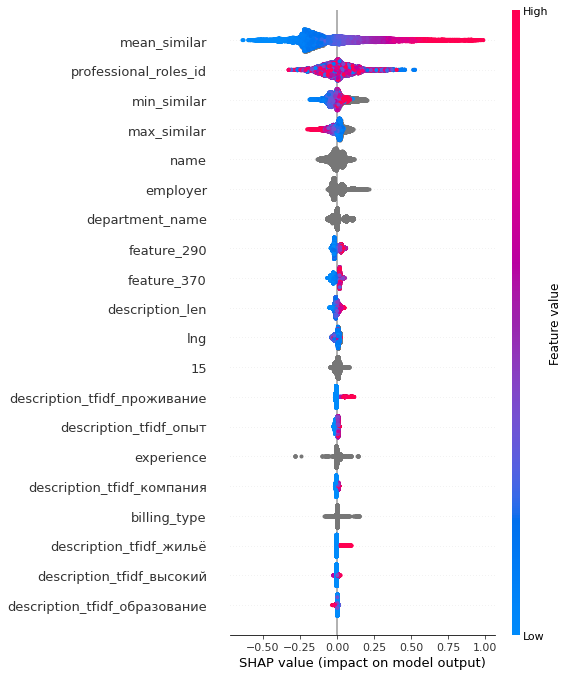

In [12]:
shap.summary_plot(shap_values, _[2]['test'])

In [38]:
model_classification = CatBoostClassifier().load_model('../app/model/base2.cbm')

buckets = list(np.arange(-1, 250_000+10_000, 10_000)) + [np.inf]
buckets = pd.DataFrame(np.vstack([buckets[:-1], buckets[1:]])).T.values

for bucket in buckets:
    df.loc[
        (df['salary_from_rate_and_gross'] > bucket[0])
            &
        (df['salary_from_rate_and_gross'] <= bucket[1])
    , 'label'] = f'[{bucket[0]}, {bucket[1]})'

In [39]:
z = pd.DataFrame()
z['salary_pred_reg'] = np.exp(model.predict(pools['test']))
z['salary_buckets_class'] = model_classification.predict(pools['test'])
z['salary_real'] = np.exp(datasets['test'][1].reset_index(drop=True))

In [40]:
z

,salary_pred_reg,salary_buckets_class,salary_real
0,47298.029417,"[29999.0, 39999.0)",30000.0
1,44574.108228,"[39999.0, 49999.0)",45000.0
2,178396.597780,"[219999.0, 229999.0)",120000.0
3,45624.274810,"[59999.0, 69999.0)",32000.0
4,62519.923549,"[59999.0, 69999.0)",60000.0
...,...,...,...
23553,86449.680119,"[79999.0, 89999.0)",67800.0
23554,40883.690760,"[29999.0, 39999.0)",24860.0
23555,54220.607332,"[49999.0, 59999.0)",50000.0
23556,61681.051820,"[59999.0, 69999.0)",73450.0


In [41]:
for bucket in buckets:
    z.loc[
        (z['salary_real'] > bucket[0])
            &
        (z['salary_real'] <= bucket[1])
    , 'label'] = f'[{bucket[0]}, {bucket[1]})'

In [42]:
z

,salary_pred_reg,salary_buckets_class,salary_real,label
0,47298.029417,"[29999.0, 39999.0)",30000.0,"[29999.0, 39999.0)"
1,44574.108228,"[39999.0, 49999.0)",45000.0,"[39999.0, 49999.0)"
2,178396.597780,"[219999.0, 229999.0)",120000.0,"[119999.0, 129999.0)"
3,45624.274810,"[59999.0, 69999.0)",32000.0,"[29999.0, 39999.0)"
4,62519.923549,"[59999.0, 69999.0)",60000.0,"[59999.0, 69999.0)"
...,...,...,...,...
23553,86449.680119,"[79999.0, 89999.0)",67800.0,"[59999.0, 69999.0)"
23554,40883.690760,"[29999.0, 39999.0)",24860.0,"[19999.0, 29999.0)"
23555,54220.607332,"[49999.0, 59999.0)",50000.0,"[49999.0, 59999.0)"
23556,61681.051820,"[59999.0, 69999.0)",73450.0,"[69999.0, 79999.0)"


In [43]:
for bucket in buckets:
    z.loc[
        (z['salary_pred_reg'] > bucket[0])
            &
        (z['salary_pred_reg'] <= bucket[1])
    , 'salary_buckets_reg'] = f'[{bucket[0]}, {bucket[1]})'

In [44]:
z

,salary_pred_reg,salary_buckets_class,salary_real,label,salary_buckets_reg
0,47298.029417,"[29999.0, 39999.0)",30000.0,"[29999.0, 39999.0)","[39999.0, 49999.0)"
1,44574.108228,"[39999.0, 49999.0)",45000.0,"[39999.0, 49999.0)","[39999.0, 49999.0)"
2,178396.597780,"[219999.0, 229999.0)",120000.0,"[119999.0, 129999.0)","[169999.0, 179999.0)"
3,45624.274810,"[59999.0, 69999.0)",32000.0,"[29999.0, 39999.0)","[39999.0, 49999.0)"
4,62519.923549,"[59999.0, 69999.0)",60000.0,"[59999.0, 69999.0)","[59999.0, 69999.0)"
...,...,...,...,...,...
23553,86449.680119,"[79999.0, 89999.0)",67800.0,"[59999.0, 69999.0)","[79999.0, 89999.0)"
23554,40883.690760,"[29999.0, 39999.0)",24860.0,"[19999.0, 29999.0)","[39999.0, 49999.0)"
23555,54220.607332,"[49999.0, 59999.0)",50000.0,"[49999.0, 59999.0)","[49999.0, 59999.0)"
23556,61681.051820,"[59999.0, 69999.0)",73450.0,"[69999.0, 79999.0)","[59999.0, 69999.0)"


In [45]:
from sklearn.metrics import mean_absolute_error as _mae, mean_absolute_percentage_error as _mape, classification_report
print(classification_report(z['label'], z['salary_buckets_class'], output_dict=False))

                      precision    recall  f1-score   support

[109999.0, 119999.0)       0.54      0.70      0.61      1001
[119999.0, 129999.0)       0.76      0.50      0.60       321
[129999.0, 139999.0)       0.61      0.57      0.59       411
[139999.0, 149999.0)       0.78      0.53      0.63       211
[149999.0, 159999.0)       0.75      0.57      0.65       197
[159999.0, 169999.0)       0.59      0.78      0.67       384
[169999.0, 179999.0)       1.00      0.74      0.85        27
[179999.0, 189999.0)       0.84      0.57      0.68        56
[189999.0, 199999.0)       0.96      0.71      0.82        63
  [19999.0, 29999.0)       0.72      0.64      0.68      1875
[199999.0, 209999.0)       0.91      0.73      0.81       127
[209999.0, 219999.0)       1.00      0.75      0.86        16
[219999.0, 229999.0)       0.78      0.72      0.75       139
  [29999.0, 39999.0)       0.66      0.73      0.70      3854
  [39999.0, 49999.0)       0.65      0.54      0.59      3212
  [4999

In [47]:
print(classification_report(z['label'], z['salary_buckets_reg'], output_dict=False))

c:\Users\maksk\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\maksk\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



                      precision    recall  f1-score   support

[109999.0, 119999.0)       0.30      0.19      0.23      1001
[119999.0, 129999.0)       0.17      0.25      0.20       321
[129999.0, 139999.0)       0.23      0.19      0.21       411
[139999.0, 149999.0)       0.14      0.16      0.15       211
[149999.0, 159999.0)       0.18      0.18      0.18       197
[159999.0, 169999.0)       0.36      0.13      0.19       384
[169999.0, 179999.0)       0.03      0.11      0.05        27
[179999.0, 189999.0)       0.04      0.07      0.05        56
[189999.0, 199999.0)       0.17      0.19      0.18        63
  [19999.0, 29999.0)       0.62      0.44      0.52      1875
[199999.0, 209999.0)       0.32      0.07      0.12       127
[209999.0, 219999.0)       0.00      0.00      0.00        16
[219999.0, 229999.0)       0.80      0.03      0.06       139
[229999.0, 239999.0)       0.00      0.00      0.00         0
  [29999.0, 39999.0)       0.57      0.55      0.56      3854
  [3999

c:\Users\maksk\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



# DecisionTree

In [42]:
X_train, X_valid, y_train, y_valid = train_test_split(
    df[features['features']].drop(
        ['salary_from_rate_and_gross_log'] + features['text_features'], axis=1
    ), 
    df['salary_from_rate_and_gross_log'], 
    test_size=0.3, 
    random_state=0, 
)
X_valid, X_test, y_valid, y_test = train_test_split(X_valid, y_valid, test_size=0.5, random_state=0)

In [27]:
encoder = preprocessing.OrdinalEncoder()
encoder.set_params(handle_unknown='use_encoded_value', unknown_value=-1)
encoder.fit(X_train[features['cat_features']])

OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

In [28]:
X_train[features['cat_features']] = encoder.transform(X_train[features['cat_features']])
X_valid[features['cat_features']] = encoder.transform(X_valid[features['cat_features']])
X_test[features['cat_features']] = encoder.transform(X_test[features['cat_features']])

In [29]:
X_train = X_train.fillna(-1)
X_valid = X_valid.fillna(-1)
X_test = X_test.fillna(-1)

In [30]:
tree = DecisionTreeRegressor(max_depth=7)
tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=7)

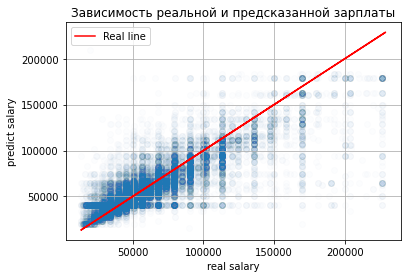

In [31]:
y_pred = tree.predict(X_test)

plot(np.exp(y_test), np.exp(y_pred))
scatter_plot(np.exp(y_test), np.exp(y_pred))

# RandomForest

In [33]:
tree = RandomForestRegressor(max_depth=15, n_estimators=100,)
tree.fit(X_train, y_train)

RandomForestRegressor(max_depth=15)

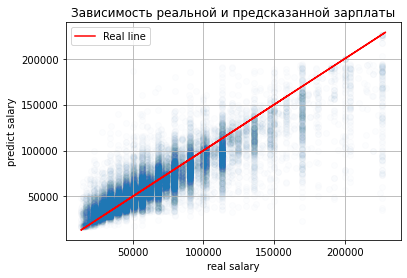

In [34]:
y_pred = tree.predict(X_test)

plot(np.exp(y_test), np.exp(y_pred))
scatter_plot(np.exp(y_test), np.exp(y_pred))

In [44]:
X_train['salary_from_rate_and_gross'] = np.exp(y_train)
baseline_score = X_train.groupby(['15', 'schedule', 'area'])['salary_from_rate_and_gross'].mean().reset_index()
baseline_table = X_test.merge(baseline_score, on = ['15', 'schedule', 'area'], how='left')

In [46]:
plot(baseline_table['salary_from_rate_and_gross'].fillna(0).values, np.exp(y_test))

In [47]:
_mape(baseline_table['salary_from_rate_and_gross'].fillna(0).values, np.exp(y_test))

2.1519182168353464e+19

In [48]:
baseline_table['salary_from_rate_and_gross'].fillna(0).values

array([ 61296.87804878,  43539.13043478,  86709.69081504, ...,
        40417.5       ,  83364.44585074, 111493.33333333])

In [50]:
np.exp(y_test)

42705      30000.0
151709     45000.0
37729     120000.0
21653      32000.0
135904     60000.0
            ...   
84595      67800.0
118067     24860.0
148346     50000.0
136527     73450.0
18552     160799.0
Name: salary_from_rate_and_gross_log, Length: 23558, dtype: float64